**9/23/2023** - as part of UQ for the paper, I wanted to see whether the composites (and my interpretation of them) differ substantially if I (1) use the Guan Waliser ARDT instead, or (2) use TECA BARD in a different location (Washington DC).  Generating composites for these cases turned out to be technically challenging, so I deviated from the original analysis method in which I made global composites of the AR times.  In this new method, I used `teca_cf_restripe` (`A_teca_cf_restripe.bash`) to spatially subset the ERA5 variables over N. America and to rewrite the data without chunking+compression on the Perlmutter SCRATCH filesystem.  This resulted in *substantially* better performance for the composite process: only 4 nodes were needed, and the jobs took less than 10 minutes each.  This is in contrast to the original attempts, where I was using 40 nodes and kept running out of time on 4-hour jobs.  Note that I also used the CPU build of TECA instead of the GPU build.  The scripts for generating the composites are: `2_submit_bard_bloomington_restripe.bash  2_submit_bard_dc.bash  2_submit_gw_bloomington.bash`

To verify that all of these changes don't affect the analysis, I also redid the TECA BARD Bloomington composites using this method.  This notebook generates composites for all these cases.

In [1]:
""" Import libraries """

import matplotlib as mpl
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import cartopy
import cmocean

mpl.style.use('seaborn-poster')

import gitsummary
print(gitsummary.print_cwd_git_version())
import socket; print(f"Running on: {socket.getfqdn()}")

No git repository detected.
Running on: login11.chn


/tmp/ipykernel_594604/2121144583.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  mpl.style.use('seaborn-poster')


In [2]:
""" Open all the composite files """

ardts = "teca_bard_v1.0.1 guan_waliser".split()
locations = "bloomington dc".split()
seasons = "DJF MAM JJA SON annual".split()
seasons = xr.DataArray(seasons, dims = ("season",))

topo_xr = xr.open_dataset("/global/cfs/cdirs/m3522/cmip6/ERA5/e5.oper.invariant/197901/e5.oper.invariant.128_129_z.ll025sc.1979010100_1979010100.nc", chunks = -1).rename(dict(Z="ZS")).squeeze().drop("time")

# initialize a dictionary of composites for each location and ardt
composite_xr_dict = { l : {} for l in locations }

for location in locations:
    for ardt in ardts:

        # skip dc guan_waliser
        if location == "dc" and ardt == "guan_waliser":
            continue
        
        xr_files = []
        for season in seasons:
            # read the xarray file for the season
            with xr.open_dataset(f"composites_restriped_temporal_reduction/{location}_{ardt}/era5_{location}_ar_composite_{season.values}_{ardt}.nc", chunks = -1) as fin:
                xr_files.append(fin.squeeze().copy())
                
        composite_xr = xr.concat(xr_files, dim = seasons)



        composite_xr = xr.merge([composite_xr, topo_xr])

        # store the composite in the dictionary
        composite_xr_dict[location][ardt] = composite_xr

# show one of the xarray composites
composite_xr_dict["bloomington"]["teca_bard_v1.0.1"]

<xarray.Dataset>
Dimensions:    (level: 29, latitude: 721, longitude: 1440, season: 5)
Coordinates:
  * level      (level) float64 50.0 70.0 100.0 125.0 ... 925.0 950.0 975.0 1e+03
  * latitude   (latitude) float64 -90.0 -89.75 -89.5 -89.25 ... 89.5 89.75 90.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * season     (season) <U6 'DJF' 'MAM' 'JJA' 'SON' 'annual'
    time       (season) datetime64[ns] 1980-01-11T09:00:00 ... 1980-01-11T09:...
Data variables: (12/15)
    T          (season, level, latitude, longitude) float32 dask.array<chunksize=(1, 29, 721, 1440), meta=np.ndarray>
    Z          (season, level, latitude, longitude) float32 dask.array<chunksize=(1, 29, 721, 1440), meta=np.ndarray>
    Q          (season, level, latitude, longitude) float32 dask.array<chunksize=(1, 29, 721, 1440), meta=np.ndarray>
    U          (season, level, latitude, longitude) float32 dask.array<chunksize=(1, 29, 721, 1440), meta=np.ndarray>
    V          (season, level, latitude, longitude) float32 dask.array<chunksize=(1, 29, 721, 1440), meta=np.ndarray>
    PV         (season, level, latitude, longitude) float32 dask.array<chunksize=(1, 29, 721, 1440), meta=np.ndarray>
    ...         ...
    TCW        (season, latitude, longitude) float32 dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    CAPE       (season, latitude, longitude) float32 dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    VIWVE      (season, latitude, longitude) float32 dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    VIWVN      (season, latitude, longitude) float32 dask.array<chunksize=(1, 721, 1440), meta=np.ndarray>
    ZS         (latitude, longitude) float32 dask.array<chunksize=(721, 1440), meta=np.ndarray>
    utc_date   int32 dask.array<chunksize=(), meta=np.ndarray>
Attributes:
    TECA_version:   5.0.0-262-g640aea2
    TECA_app_name:  python3.8

In [3]:
""" Subset the data and calculate extra variables like IVT and IWV """
# set the latitude/longitudes of the center of the composites
clats = {}
clons = {}
clats['bloomington'] = 39.1653
clons['bloomington'] = -86.5264 + 360
clats['dc'] = 38.895
clons['dc'] = -77.036 + 360

half_lon_width = 35
half_lat_width = 15
buffer = 8

g = 9.80665
cp = 1004.68506
M = 0.02896968
R0 = 8.314462618

for location in composite_xr_dict:
    for ardt in composite_xr_dict[location]:
        composite_xr = composite_xr_dict[location][ardt]

        comp_xr_subset = composite_xr

        h = comp_xr_subset.ZS/g
        ps = comp_xr_subset.SP
        t0 = comp_xr_subset.VAR_2T

        ivt = np.sqrt(comp_xr_subset.VIWVE**2 + comp_xr_subset.VIWVN**2)
        comp_xr_subset['IVT'] = ivt
        comp_xr_subset['IVT'].attrs['units'] = 'kg m-1 s-1'

        iwv = comp_xr_subset.TCW/10 # cm
        comp_xr_subset['IWV'] = iwv
        comp_xr_subset['IWV'].attrs['units'] = 'cm'

        # calculate potential temperature
        Rd = 287.
        cpd = 1005.
        p0 = 1e3
        p = comp_xr_subset.level
        comp_xr_subset['theta'] = comp_xr_subset['T']*(p0/p)**(Rd/cpd)

        comp_xr_subset['Q'] *= 1e3

        # fix the units of PV
        comp_xr_subset['PV'] *= 1e6
        comp_xr_subset['PV'].attrs['units'] = 'PVU'

        Z = comp_xr_subset['Z'] / g # geopotential height [m]
        comp_xr_subset['Z_m'] = Z
        comp_xr_subset['Z_m'].attrs['units'] = 'm'

        T = comp_xr_subset['theta'] - 273.15 # C
        comp_xr_subset['theta_C'] = T
        comp_xr_subset['theta_C'].attrs['units'] = 'C'

        slp = ps*(1 - (g*h)/(cp*t0))**(-cp*M/R0)/100 # mb
        comp_xr_subset['slp'] = slp
        comp_xr_subset['slp'].attrs['units'] = 'mb'






In [4]:
def great_circle_distance(lat1, long1, lat2, long2):

    R = 6.371e3 # km
    # Convert latitude and longitude to 
    # spherical coordinates in radians.
    degrees_to_radians = np.pi/180.0
        
    # phi = 90 - latitude
    phi1 = (90.0 - lat1)*degrees_to_radians
    phi2 = (90.0 - lat2)*degrees_to_radians
        
    # theta = longitude
    theta1 = long1*degrees_to_radians
    theta2 = long2*degrees_to_radians
        
    # Compute spherical distance from spherical coordinates.
        
    # For two locations in spherical coordinates 
    # (1, theta, phi) and (1, theta, phi)
    # cosine( arc length ) = 
    #    sin phi sin phi' cos(theta-theta') + cos phi cos phi'
    # distance = rho * arc length
    
    cos = (np.sin(phi1)*np.sin(phi2)*np.cos(theta1 - theta2) + 
           np.cos(phi1)*np.cos(phi2))
    arc = np.arccos( cos )

    return R*arc

In [5]:
""" Generate a transect line """

lon_interp_dict = {}
lat_interp_dict = {}
normal_vector_x_dict = {}
normal_vector_y_dict = {}
parallel_vector_x_dict = {}
parallel_vector_y_dict = {}

for location in locations:
    blat = clats[location]
    blon = clons[location]
    
    # the transect line
    m = -0.45
    dlon = 20
    transect_a_lat = blat - m*dlon
    transect_b_lat = blat + m*dlon
    transect_a_lon = blon - dlon
    transect_b_lon = blon + dlon
    delta_lon = 0.25
    lon_interp = np.arange(transect_a_lon, transect_b_lon + delta_lon, delta_lon)
    lat_interp = m*lon_interp + (transect_a_lat - m*transect_a_lon)

    # set the distances along the line
    total_d = great_circle_distance(transect_a_lat, transect_a_lon, transect_b_lat, transect_b_lon)
    distances = np.linspace(-total_d/2, total_d/2, len(lat_interp))


    # create an xarray dataarray out of the x/y coordinates to which we'll interpolate
    lon_interp_da = xr.DataArray(lon_interp, dims = 'distance', coords = dict(distance = distances))
    lat_interp_da = xr.DataArray(lat_interp, dims = 'distance')

    # determine the unit normal vector to the transect, for calculating winds through the transect
    normal_slope = -1/m
    normal_vector_y = normal_slope
    normal_vector_x = 1
    normal_vector_magnitude = np.sqrt(normal_slope**2 + 1)
    normal_vector_x /= normal_vector_magnitude
    normal_vector_y /= normal_vector_magnitude

    parallel_slope = m
    parallel_vector_y = parallel_slope
    parallel_vector_x = 1
    parallel_vector_magnitude = np.sqrt(parallel_slope**2 + 1)
    parallel_vector_x /= parallel_vector_magnitude
    parallel_vector_y /= parallel_vector_magnitude

    # store the x/y coordinates and unit normal vector in dictionaries
    lon_interp_dict[location] = lon_interp_da
    lat_interp_dict[location] = lat_interp_da
    normal_vector_x_dict[location] = normal_vector_x
    normal_vector_y_dict[location] = normal_vector_y
    parallel_vector_x_dict[location] = parallel_vector_x
    parallel_vector_y_dict[location] = parallel_vector_y




bloomington teca_bard_v1.0.1


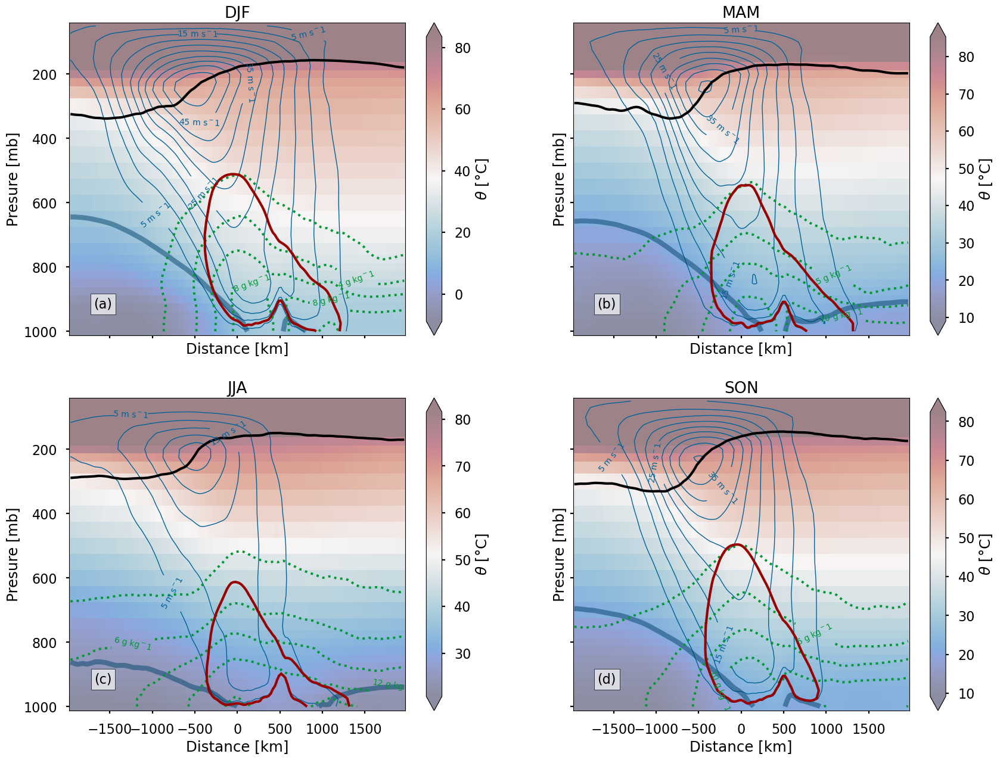

bloomington guan_waliser


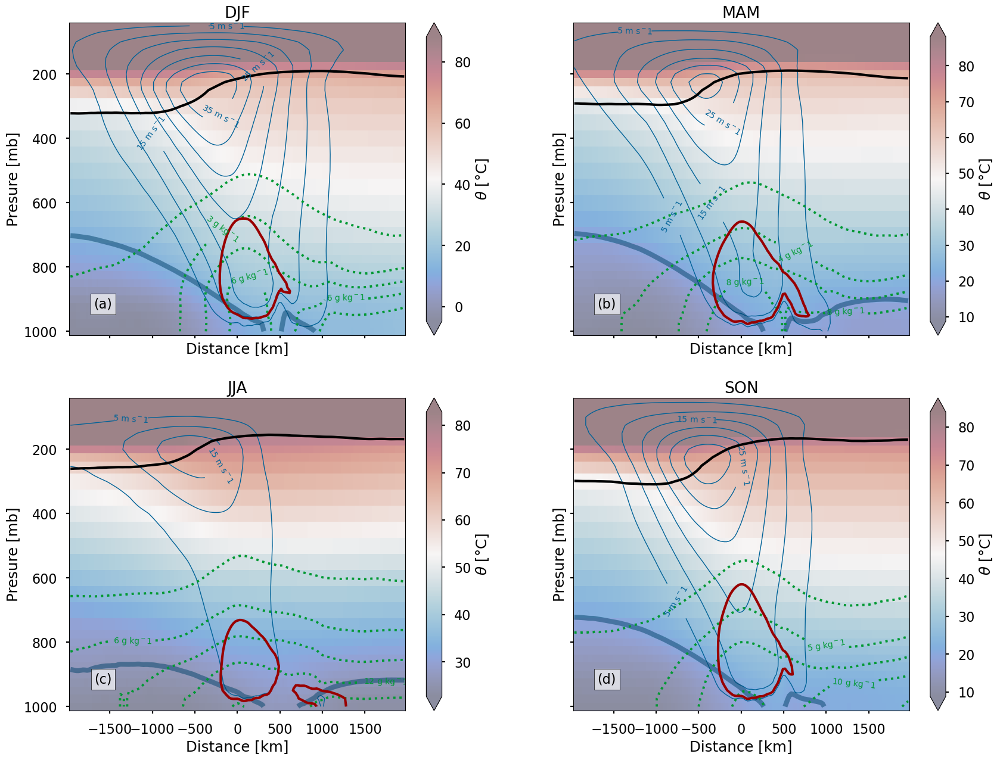

dc teca_bard_v1.0.1


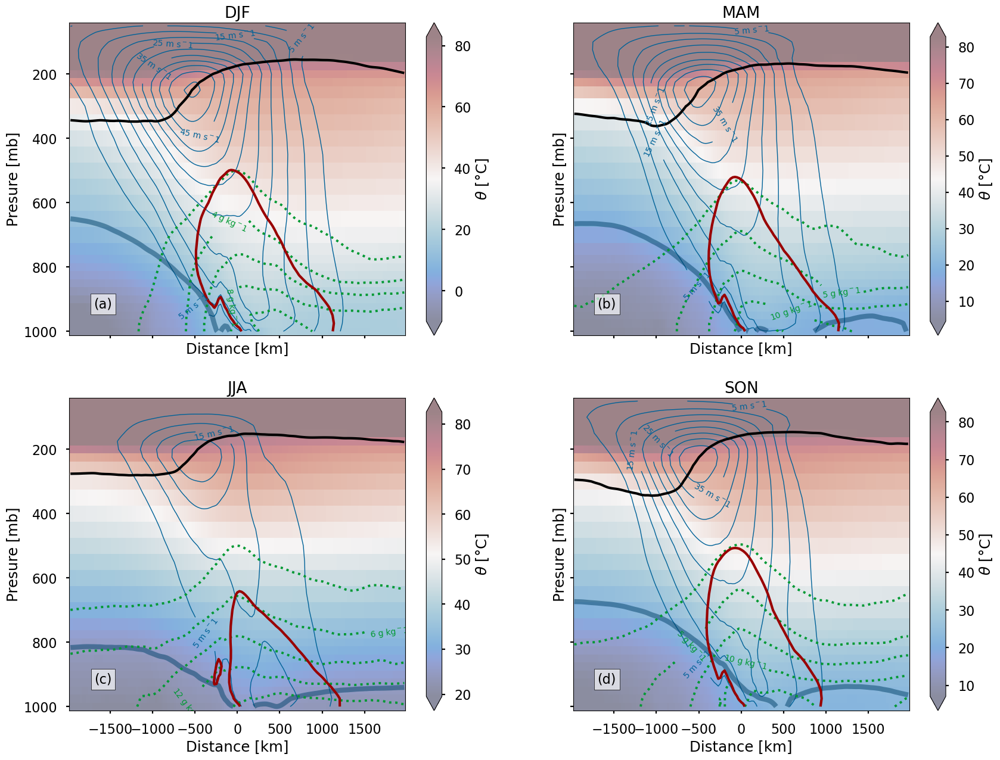

In [6]:
""" Generate transect plots """

for location in composite_xr_dict:

    # extract the x/y coordinates and unit normal vector from the dictionaries
    lon_interp_da = lon_interp_dict[location]
    lat_interp_da = lat_interp_dict[location]
    normal_vector_x = normal_vector_x_dict[location]
    normal_vector_y = normal_vector_y_dict[location]
    parallel_vector_x = parallel_vector_x_dict[location]
    parallel_vector_y = parallel_vector_y_dict[location]


    for ardt in composite_xr_dict[location]:
        composite_xr = composite_xr_dict[location][ardt]
        comp_xr_subset = composite_xr

        # set the plot labels
        plot_labels = "a b c d".split()

        fig, axs = plt.subplots(2,2,figsize = (20,15), sharex = True, sharey = True)

        for i,season in enumerate(seasons[:-1]):
            
            ax = axs.ravel()[i]

            #transect_xr = comp_xr_subset.sel(season = season).sel(longitude = clon, method = 'nearest')
            transect_xr = comp_xr_subset.sel(season = season).interp(latitude = lat_interp_da, longitude = lon_interp_da)
            

            # **************
            # wind contours
            # **************
            Unorm = normal_vector_x * transect_xr['U'] + normal_vector_y * transect_xr['V']
            CS = Unorm.plot.contour(
                ax = ax,
                colors = ["#006298"],
                levels = np.arange(5,60,5),
                linewidths = 1,
            )
            def fmt(x):
                return f"{int(x)} m s$^{-1}$"
            ax.clabel(CS, CS.levels[::2], inline=True, fmt=fmt)#, fontsize=10)
            
            ## ************
            ## streamlines
            ## ************
            #Uparallel = parallel_vector_x * transect_xr['U'] + parallel_vector_y * transect_xr['V']
            #omega = transect_xr['W'] / 100 # convert to hPa/s so we are in units of the graph axes
            #Uparallel /= 1000 # convert to km/s so we are in units of the graph axes
            ## put in a datset for plotting and interpolating
            #stream_ds = xr.Dataset()
            #stream_ds['U'] = Uparallel
            #stream_ds['W'] = omega
            #stream_ds = stream_ds.interp(level = np.arange(0,1050,10))
            #stream_ds.plot.streamplot('distance','level','U','W', ax = ax, color = "#555555AA")
            

            # ************
            # temperature
            # ************
            theta = transect_xr['theta'] - 273.15
            thmin = float(theta.sel(distance = -1500, level = 1000, method = 'nearest').values)
            thmax = float(theta.sel(distance = 1500, level = 150, method = 'nearest').values)
            theta.plot(
                ax = ax,
                cmap = cmocean.cm.balance,
                vmin = thmin, vmax = thmax,
                alpha = 0.5,
                cbar_kwargs = dict(label = r"$\theta$ [°C]"),
                linewidth = 0,
                rasterized = True,
            )

            # ***********
            # frontal zone
            # *************
            i_max_grad = transect_xr['theta'].differentiate('distance').argmin(dim = 'distance')
            #lat_max_grad = transect_xr['latitude'].isel(latitude = i_max_grad)
            # find the surface temperature at the point of the maximum gradient; use this as the theta contour
            t_max_grad = float(theta.isel(distance = i_max_grad.sel(level = 1000).values).sel(level = 1000).values)
            theta.plot.contour(
                ax = ax,
                colors = ["#01426A"],
                linewidths = [6],
                linestyles = ['-'],
                alpha = 0.5,
                levels = [t_max_grad],
            )


            # *********
            # humidity
            # *********
            CS = transect_xr['Q'].plot.contour(
                ax = ax,
                linestyles = [':'],
                colors = ["#009933"],
            )
            def fmt(x):
                return f"{int(x)} g kg$^{-1}$"
            ax.clabel(CS, CS.levels[::2], inline=True, fmt=fmt)#, fontsize=10)

            # ***********
            # tropopause
            # ***********
            # plot the 2 PVU contour, but remove low-level PV
            plot_pv = transect_xr['PV'].sel(level = slice(1,800))
            plot_pv.plot.contour(
                ax = ax,
                colors = ["black"],
                linewidths = [3],
                levels = [2],
            )


            # **************
            # moisture flux
            # **************
            qu = transect_xr['Q'] * Unorm 
            qu.plot.contour(
                ax = ax,
                colors = ["#990000"],
                linewidths = [3],
                levels = [60],
            )
            

            ax.set_ylabel("Presure [mb]")
            ax.set_xlabel("Distance [km]")
            #ax.invert_xaxis()
            ax.invert_yaxis()

            # set the title
            ax.set_title(str(season.values))
            
            # add the plot label
            ax.text(0.1, 0.1,
                    f"({plot_labels[i]})",
                    fontsize = 16,
                    bbox=dict(facecolor='#FFFFFFAA', edgecolor='black'),
                    ha='center', va='center', 
                    transform = ax.transAxes)

        plt.savefig(f'uq_fig_transect_composites_{location}_{ardt}.pdf', bbox_inches = 'tight', dpi = 300)
        plt.savefig(f'uq_fig_transect_composites_{location}_{ardt}.png', bbox_inches = 'tight', dpi = 300)
        print(f"{location} {ardt}")
        plt.show()

**Caption:** Composite transects of potential temperature (shading), transect-normal winds (blue curves), specific humidity (dotted green curves), moisture flux at the 60 g m kg$^{-1}$ s$^{-1}$ level (red contour), and the 2 PVU potential vorticity contour (black curve) for AR conditions over Bloomington, IN in (a) DJF, (b) MAM, (c) JJA, and (d) SON. Thick, transparent blue curves in all four panels show frontal zones.

bloomington teca_bard_v1.0.1


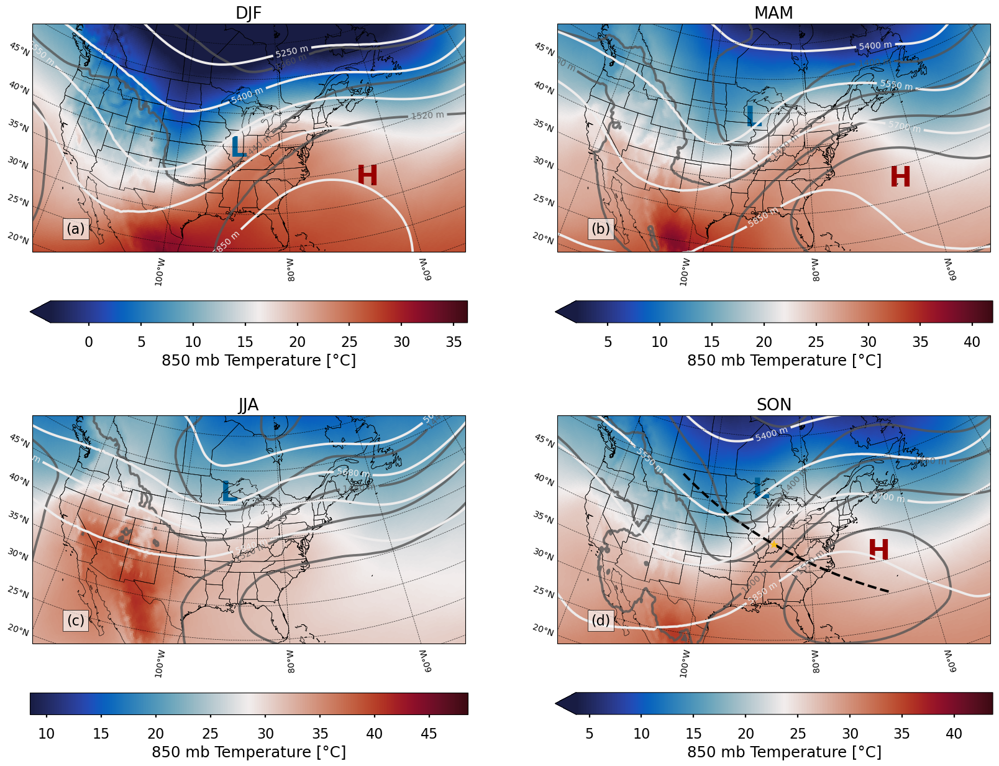

bloomington guan_waliser


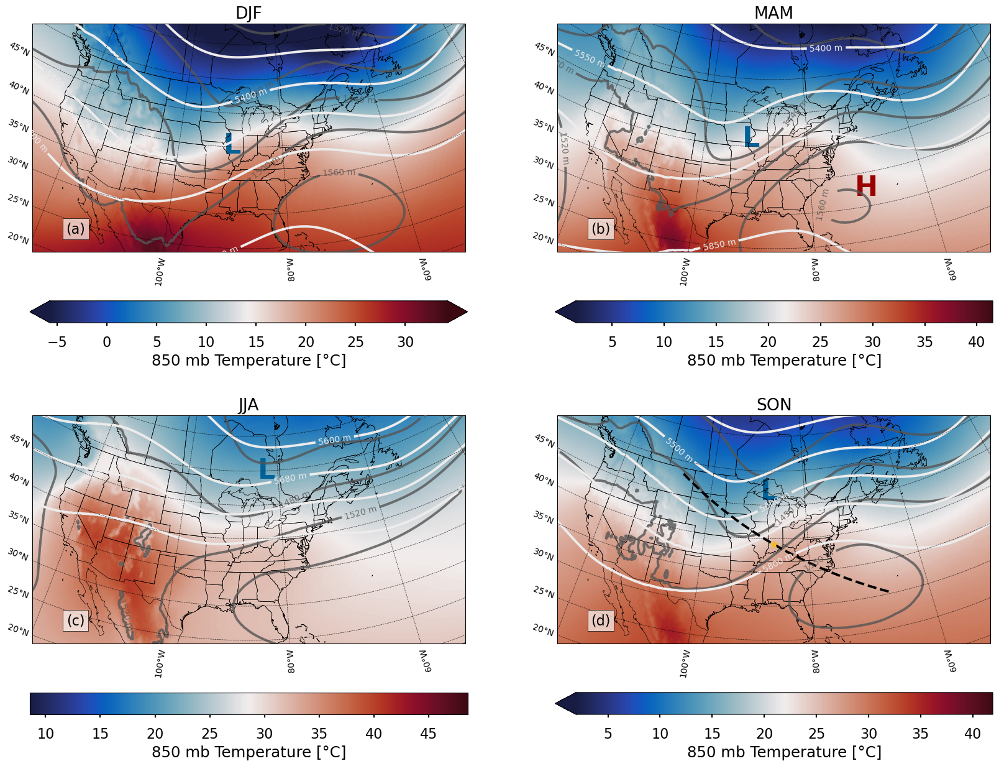

dc teca_bard_v1.0.1


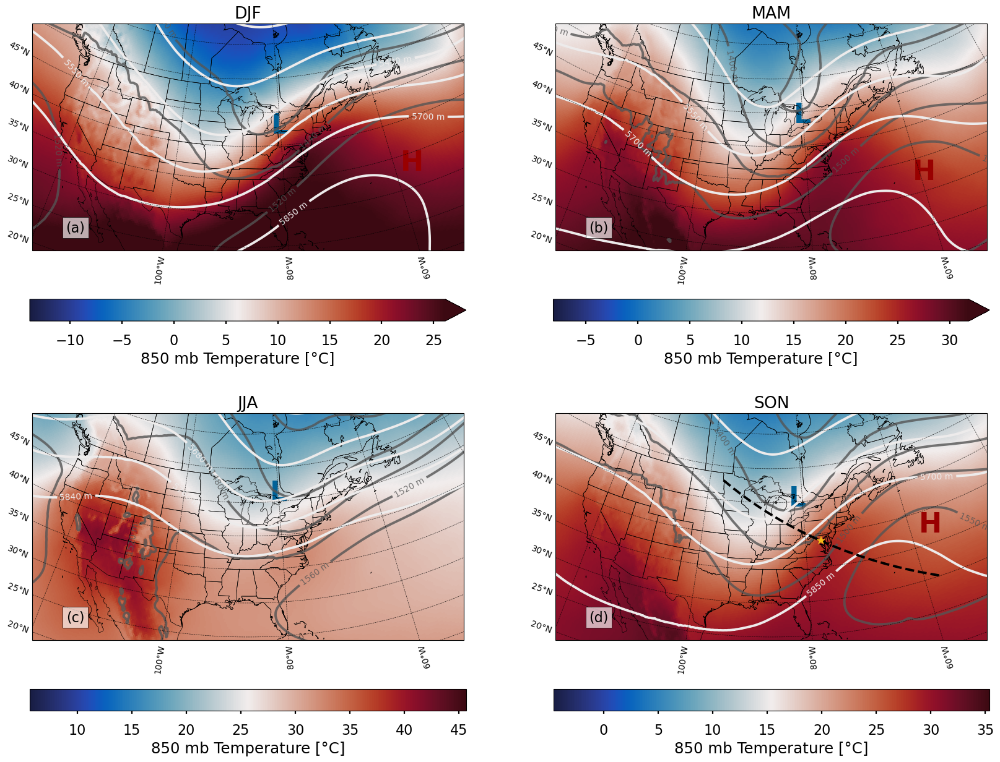

In [7]:
""" Plot T850, Z850, Z200 and the low """

# set the lat for choosing the midpoint of the temperature color scale
clat, clon = 41.8781, 360-87.6298
# set the lat/lon of bloomington
blat = clats['bloomington']
blon = clons['bloomington']
projection = cartopy.crs.LambertConformal(central_latitude = blat, central_longitude = blon)
transform = cartopy.crs.PlateCarree()

for location in composite_xr_dict:

    # extract the lat/lon transect coordinates from the dictionaries
    lon_interp_da = lon_interp_dict[location]
    lat_interp_da = lat_interp_dict[location]
    comp_lat = clats[location]
    comp_lon = clons[location]

    for ardt in composite_xr_dict[location]:
        composite_xr = composite_xr_dict[location][ardt]
        comp_xr_subset = composite_xr
        # extract/transform some variables for plotting
        T = comp_xr_subset['theta_C']
        Z = comp_xr_subset['Z_m']
        slp = comp_xr_subset['slp']

        fig, axs = plt.subplots(2,2,figsize = (20,15), subplot_kw = dict(projection = projection))

        for i,season in enumerate(seasons[:-1]):
            
            ax = axs.ravel()[i]

            ax.set_extent([blon - half_lon_width, blon + half_lon_width, blat - half_lat_width, blat + half_lat_width], crs = cartopy.crs.PlateCarree())
            

            level = 850
            tmid = float(T.sel(latitude = clat, longitude = clon, level = level, method = 'nearest').sel(season = season).values)
            tspan = 20
            T.sel(season = season, level = level).plot(ax = ax, transform = transform, cmap = cmocean.cm.balance,
                                vmin = tmid-tspan, vmax = tmid+tspan, 
                                linewidth = 0, rasterized = True,
                                    cbar_kwargs = dict(label = f"{level} mb Temperature [°C]", orientation = 'horizontal'))

            CS = Z.sel(season = season, level = 850).plot.contour(ax = ax, transform = transform, colors = "#555555FF", alpha = 0.8)
            fmt = lambda x : f"{int(x)} m"
            ax.clabel(CS, CS.levels, inline=True, fmt=fmt)#, fontsize=10)
            
            CS = Z.sel(season = season, level = 500).plot.contour(ax = ax, transform = transform, colors = "#EDEBEBFF")
            ax.clabel(CS, CS.levels, inline=True, fmt=fmt)#, fontsize=10)

            #CS = Z.sel(season = season, level = 250).plot.contour(ax = ax, transform = transform, colors = "#EDEBEB99")
            #ax.clabel(CS, CS.levels, inline=True, fmt=fmt)#, fontsize=10)
            
            # add an L near the surface low
            slp_midwest = slp.sel(season = season, longitude = slice(360-100, 360-80), latitude = slice(35, 50))
            nmin = slp_midwest.argmin()
            imin, jmin = np.unravel_index(nmin.values, slp_midwest.shape)
            lat_slp_min = float(slp_midwest.latitude.isel(latitude = imin).values)
            lon_slp_min = float(slp_midwest.longitude.isel(longitude = jmin).values)
            ax.text(lon_slp_min, lat_slp_min,
                    "L",
                    transform = transform,
                    color = "#006298",
                    fontdict = dict(size = 32, weight = 'bold'),
                    ha='center', va='center', 
                    zorder = 1)
            
            # add an H near the surface low
            slp_atlantic = slp.sel(season = season, longitude = slice(360-85, 360-55), latitude = slice(25, 45))
            nmax = slp_atlantic.argmax()
            imax, jmax = np.unravel_index(nmax.values, slp_atlantic.shape)
            lat_slp_max = float(slp_atlantic.latitude.isel(latitude = imax).values)
            lon_slp_max = float(slp_atlantic.longitude.isel(longitude = jmax).values)
            if(lon_slp_max != (360 - 55) and lon_slp_max != (360 - 83)):
                ax.text(lon_slp_max, lat_slp_max,
                        "H",
                        transform = transform,
                        color = "#990000",
                        fontdict = dict(size = 32, weight = 'bold'),
                        ha='center', va='center', 
                        zorder = 1)
                
                
            # plot the transect line
            if i == 3:
                ax.plot(lon_interp_da, lat_interp_da, color = "black", linestyle = '--', transform = transform)
                ax.plot(comp_lon, comp_lat, color = "#F5BB17", linestyle = '--', marker = '*', transform = transform)
                

            ax.gridlines(auto_inline = False, draw_labels = dict(bottom="x", left="y"), linewidth = 0.5, alpha = 0.8, color = 'black', linestyle = '--')
            ax.coastlines()
            ax.add_feature(cartopy.feature.STATES)
            ax.set_title(str(season.values))
            
            # add the plot label
            ax.text(0.1, 0.1,
                    f"({plot_labels[i]})",
                    fontsize = 16,
                    bbox=dict(facecolor='#FFFFFFAA', edgecolor='black'),
                    ha='center', va='center', 
                    transform = ax.transAxes)

            
        plt.savefig(f'uq_fig_dynamic_composites_{location}_{ardt}.pdf', bbox_inches = 'tight', dpi = 300)
        plt.savefig(f'uq_fig_dynamic_composites_{location}_{ardt}.png', bbox_inches = 'tight', dpi = 300)
        print(f"{location} {ardt}")
        plt.show()                       

**Caption:** Composite maps of 850 mb temperature (shading), 850 mb heights (dark gray contours), 500 mb heights (light gray contours), 250 mb heights (white contours), and surface low and high presures (L and H symbols) for AR conditions over Bloomington, IN in (a) DJF, (b) MAM, (c) JJA, and (d) SON.  The dashed black curve in (d) shows the location of the transect.

bloomington teca_bard_v1.0.1 DJF 294.75 33.5
bloomington teca_bard_v1.0.1 MAM 296.0 33.0
bloomington teca_bard_v1.0.1 JJA 305.0 29.25
bloomington teca_bard_v1.0.1 SON 293.0 36.5
bloomington teca_bard_v1.0.1


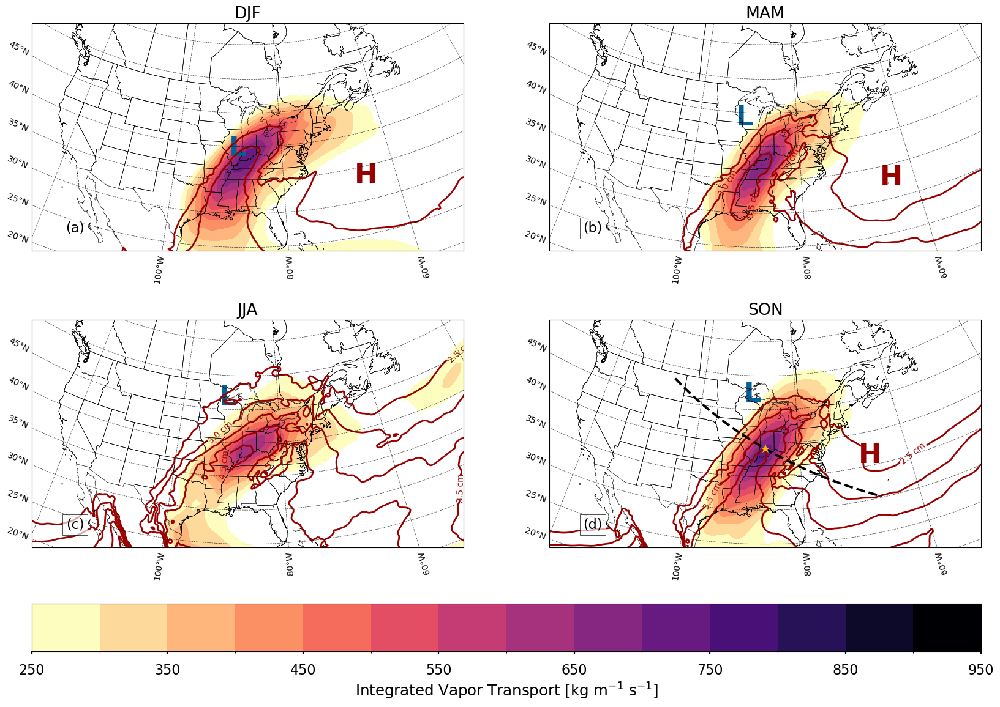

bloomington guan_waliser DJF 277.0 35.25
bloomington guan_waliser MAM 289.75 32.75
bloomington guan_waliser JJA 305.0 30.5
bloomington guan_waliser SON 277.0 35.25
bloomington guan_waliser


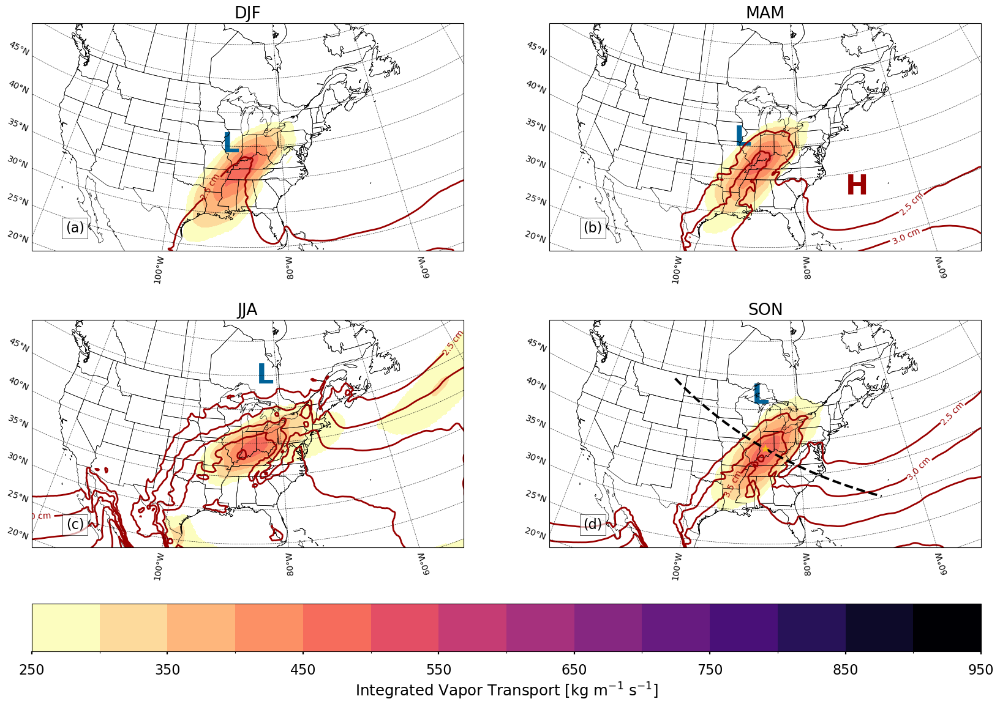

dc teca_bard_v1.0.1 DJF 303.25 33.5
dc teca_bard_v1.0.1 MAM 300.75 32.75
dc teca_bard_v1.0.1 JJA 305.0 31.25
dc teca_bard_v1.0.1 SON 304.0 37.75
dc teca_bard_v1.0.1


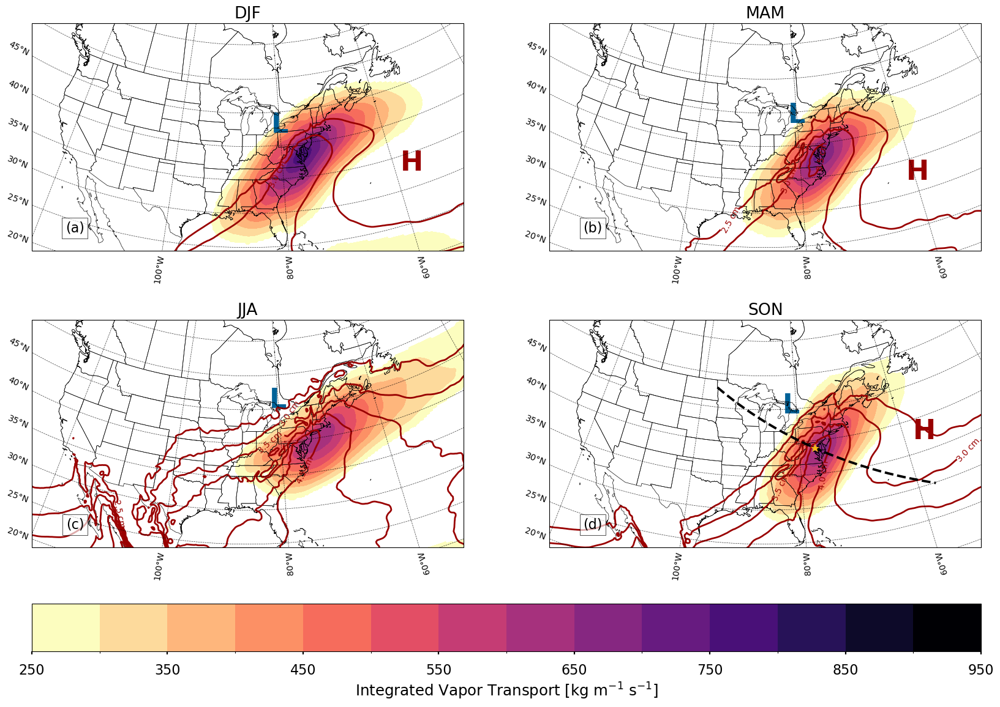

In [8]:
""" Plot IVT, IWV """

# set the lat/lon of bloomington
blat = clats['bloomington']
blon = clons['bloomington']
projection = cartopy.crs.LambertConformal(central_latitude = blat, central_longitude = blon)
transform = cartopy.crs.PlateCarree()

for location in composite_xr_dict:

    # extract the lat/lon transect coordinates from the dictionaries
    lon_interp_da = lon_interp_dict[location]
    lat_interp_da = lat_interp_dict[location]
    comp_lat = clats[location]
    comp_lon = clons[location]

    for ardt in composite_xr_dict[location]:
        composite_xr = composite_xr_dict[location][ardt]
        comp_xr_subset = composite_xr
        # extract/transform some variables for plotting
        T = comp_xr_subset['theta_C']
        Z = comp_xr_subset['Z_m']
        slp = comp_xr_subset['slp']
        ivt = comp_xr_subset['IVT']
        iwv = comp_xr_subset['IWV']

        fig, axs = plt.subplots(2,2,figsize = (20,15), subplot_kw = dict(projection = projection))

        for i,season in enumerate(seasons[:-1]):
            
            ax = axs.ravel()[i]

            ax.set_extent([blon - half_lon_width, blon + half_lon_width, blat - half_lat_width, blat + half_lat_width], crs = cartopy.crs.PlateCarree())
            
            # ****
            # IVT
            # ****
            ivt_masked = ivt.where(ivt >= 250)
            cplt = ivt_masked.sel(season = season).plot.contourf(
                ax = ax,
                cmap = 'magma_r',
                levels = np.arange(250,1000, 50),
                transform = transform,
                add_colorbar = False,
            )
                
            
            # ****
            # IWV
            # ****
            CS = iwv.sel(season = season).plot.contour(
                ax = ax,
                levels = [2.5,3,3.5,4,4.5,5,5.5,6],
                colors = "#990000",
                linewidths = 2,
                transform = transform,
            )
            fmt = lambda x : f"{float(x)} cm"
            ax.clabel(CS, CS.levels, inline=True, fmt=fmt)#, fontsize=10)
            
            
            # add an L near the surface low
            slp_midwest = slp.sel(season = season, longitude = slice(360-100, 360-80), latitude = slice(35, 50))
            nmin = slp_midwest.argmin()
            imin, jmin = np.unravel_index(nmin.values, slp_midwest.shape)
            lat_slp_min = float(slp_midwest.latitude.isel(latitude = imin).values)
            lon_slp_min = float(slp_midwest.longitude.isel(longitude = jmin).values)
            ax.text(lon_slp_min, lat_slp_min,
                    "L",
                    transform = transform,
                    color = "#006298",
                    fontdict = dict(size = 32, weight = 'bold'),
                    ha='center', va='center', 
                    zorder = 1)
            
            # add an H near the surface low
            slp_atlantic = slp.sel(season = season, longitude = slice(360-85, 360-55), latitude = slice(25, 45))
            nmax = slp_atlantic.argmax()
            imax, jmax = np.unravel_index(nmax.values, slp_atlantic.shape)
            lat_slp_max = float(slp_atlantic.latitude.isel(latitude = imax).values)
            lon_slp_max = float(slp_atlantic.longitude.isel(longitude = jmax).values)
            print(f"{location} {ardt} {season.values} {lon_slp_max} {lat_slp_max}")
            if(lon_slp_max != (360 - 55) and lon_slp_max != (360 - 83)):
                ax.text(lon_slp_max, lat_slp_max,
                        "H",
                        transform = transform,
                        color = "#990000",
                        fontdict = dict(size = 32, weight = 'bold'),
                        ha='center', va='center', 
                        zorder = 1)
                
            ax.gridlines(auto_inline = False, draw_labels = dict(bottom="x", left="y"), linewidth = 0.5, alpha = 0.8, color = 'black', linestyle = '--')
            ax.coastlines()
            ax.add_feature(cartopy.feature.STATES)
            ax.set_title(str(season.values))
            
            # add the plot label
            ax.text(0.1, 0.1,
                    f"({plot_labels[i]})",
                    fontsize = 16,
                    bbox=dict(facecolor='#FFFFFFAA', edgecolor='black'),
                    ha='center', va='center', 
                    transform = ax.transAxes)
            
            # plot the transect line
            if i == 3:
                ax.plot(lon_interp_da, lat_interp_da, color = "black", linestyle = '--', transform = transform)
                ax.plot(comp_lon, comp_lat, color = "#F5BB17", linestyle = '--', marker = '*', transform = transform)
                
            
            
        fig.colorbar(cplt, ax = axs.ravel(), label = "Integrated Vapor Transport [kg m$^{-1}$ s$^{-1}$]", orientation = 'horizontal', pad = 0.08)
        plt.savefig(f'uq_fig_moisture_composites_{location}_{ardt}.pdf', bbox_inches = 'tight')
        plt.savefig(f'uq_fig_moisture_composites_{location}_{ardt}.png', bbox_inches = 'tight', dpi = 300)
        print(f"{location} {ardt}")
        plt.show()                       

bloomington teca_bard_v1.0.1


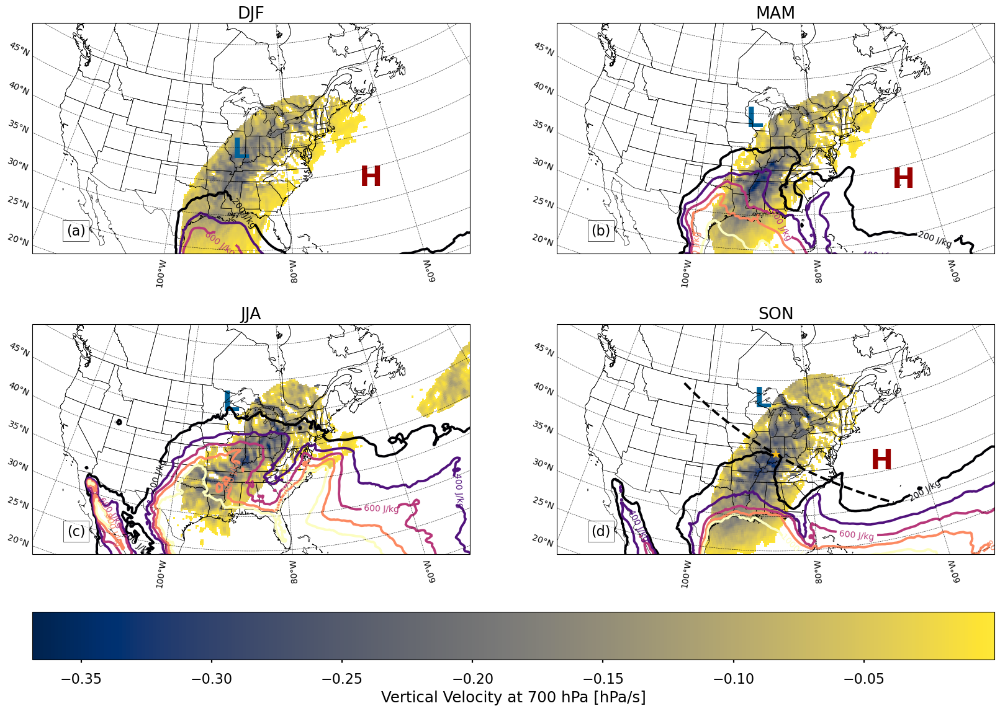

bloomington guan_waliser


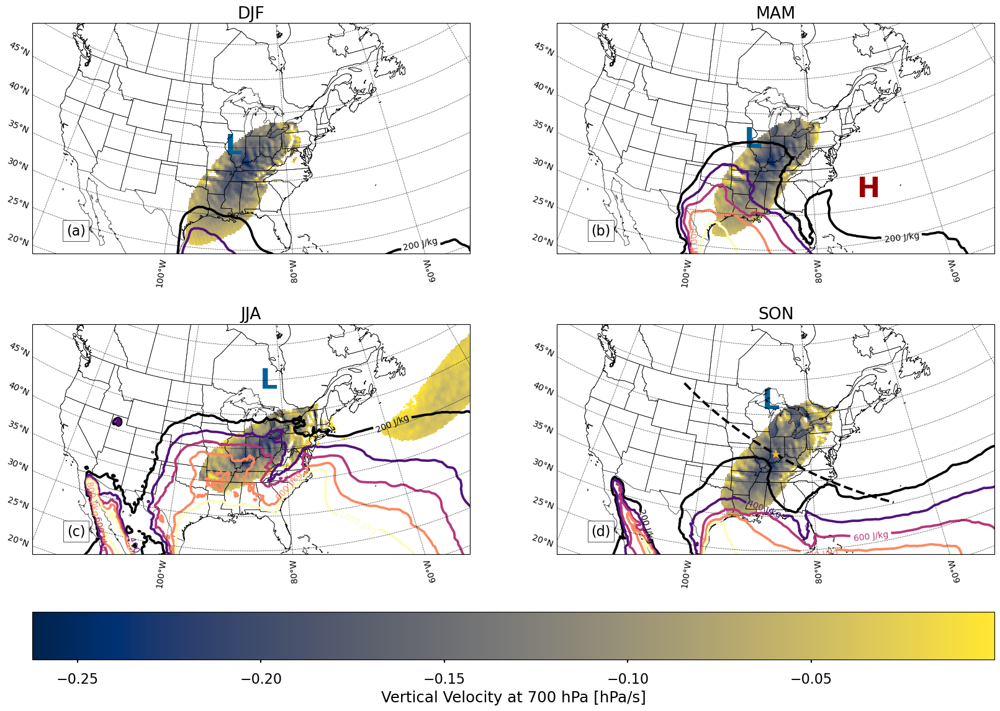

dc teca_bard_v1.0.1


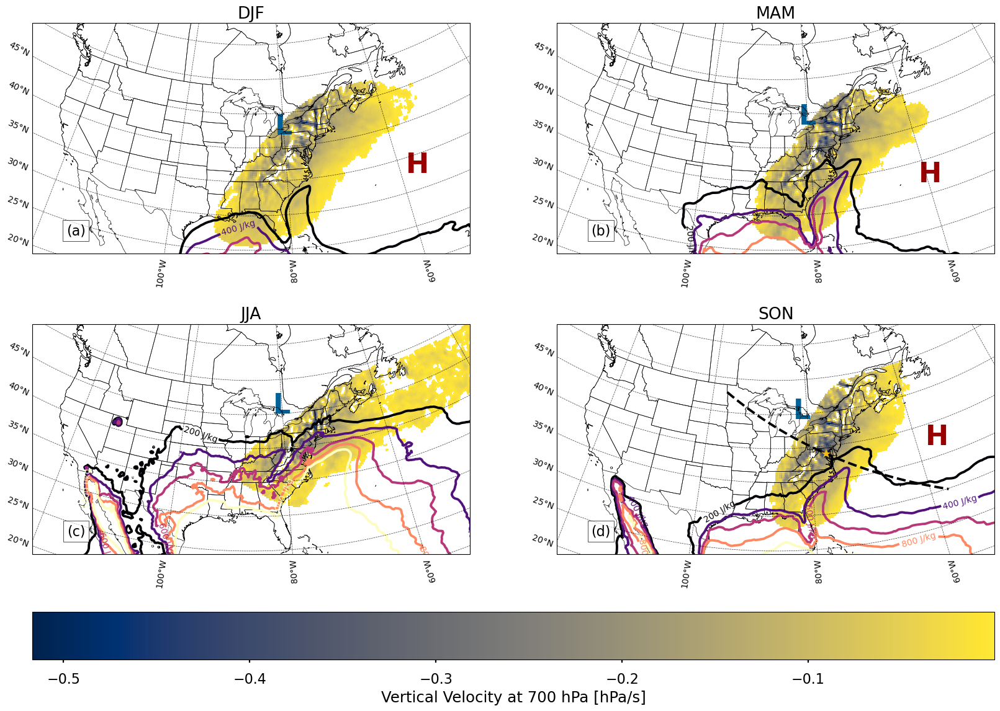

In [9]:
""" Plot CAPE, omega, etc."""

# set the lat/lon of bloomington
blat = clats['bloomington']
blon = clons['bloomington']
projection = cartopy.crs.LambertConformal(central_latitude = blat, central_longitude = blon)
transform = cartopy.crs.PlateCarree()

for location in composite_xr_dict:

    # extract the lat/lon transect coordinates from the dictionaries
    lon_interp_da = lon_interp_dict[location]
    lat_interp_da = lat_interp_dict[location]
    comp_lat = clats[location]
    comp_lon = clons[location]

    for ardt in composite_xr_dict[location]:
        composite_xr = composite_xr_dict[location][ardt]
        comp_xr_subset = composite_xr
        # extract/transform some variables for plotting
        slp = comp_xr_subset['slp']
        ivt = comp_xr_subset['IVT']

        fig, axs = plt.subplots(2,2,figsize = (20,15), subplot_kw = dict(projection = projection))

        for i,season in enumerate(seasons[:-1]):

            
            ax = axs.ravel()[i]

            ax.set_extent([blon - half_lon_width, blon + half_lon_width, blat - half_lat_width, blat + half_lat_width], crs = cartopy.crs.PlateCarree())
            
            # ****
            # W
            # ****
            omega = comp_xr_subset['W'].sel(season = season, level = 700)
            omega_masked = omega.where(omega < 0).where(ivt.sel(season = season) > 250)
            cplt = omega_masked.plot(
                ax = ax,
                cmap = 'cividis',
                transform = transform,
                add_colorbar = False,
                linewidth = 0,
                rasterized = True,
            )
            
            # *****
            # CAPE
            # *****
            cape = comp_xr_subset['CAPE'].sel(season = season)
            CS = cape.plot.contour(
                ax = ax,
                cmap = 'magma',
                transform = transform,
                add_colorbar = False,
                levels = np.arange(200,1200,200),
            )
            fmt = lambda x : f"{int(x)} J/kg"
            ax.clabel(CS, CS.levels, inline=True, fmt=fmt)#, fontsize=10)
                
            
            # add an L near the surface low
            slp_midwest = slp.sel(season = season, longitude = slice(360-100, 360-80), latitude = slice(35, 50))
            nmin = slp_midwest.argmin()
            imin, jmin = np.unravel_index(nmin.values, slp_midwest.shape)
            lat_slp_min = float(slp_midwest.latitude.isel(latitude = imin).values)
            lon_slp_min = float(slp_midwest.longitude.isel(longitude = jmin).values)
            ax.text(lon_slp_min, lat_slp_min,
                    "L",
                    transform = transform,
                    color = "#006298",
                    fontdict = dict(size = 32, weight = 'bold'),
                    ha='center', va='center', 
                    zorder = 1)
            
            # add an H near the surface low
            slp_atlantic = slp.sel(season = season, longitude = slice(360-85, 360-55), latitude = slice(25, 45))
            nmax = slp_atlantic.argmax()
            imax, jmax = np.unravel_index(nmax.values, slp_atlantic.shape)
            lat_slp_max = float(slp_atlantic.latitude.isel(latitude = imax).values)
            lon_slp_max = float(slp_atlantic.longitude.isel(longitude = jmax).values)
            if(lon_slp_max != (360 - 55) and lon_slp_max != (360 - 83)):
                ax.text(lon_slp_max, lat_slp_max,
                        "H",
                        transform = transform,
                        color = "#990000",
                        fontdict = dict(size = 32, weight = 'bold'),
                        ha='center', va='center', 
                        zorder = 1)
                
            ax.gridlines(auto_inline = False, draw_labels = dict(bottom="x", left="y"), linewidth = 0.5, alpha = 0.8, color = 'black', linestyle = '--')
            ax.coastlines()
            ax.add_feature(cartopy.feature.STATES)
            ax.set_title(str(season.values))
            
            # add the plot label
            ax.text(0.1, 0.1,
                    f"({plot_labels[i]})",
                    fontsize = 16,
                    bbox=dict(facecolor='#FFFFFFAA', edgecolor='black'),
                    ha='center', va='center', 
                    transform = ax.transAxes)
            
            # plot the transect line
            if i == 3:
                ax.plot(lon_interp_da, lat_interp_da, color = "black", linestyle = '--', transform = transform)
                ax.plot(comp_lon, comp_lat, color = "#F5BB17", linestyle = '--', marker = '*', transform = transform)
                
            
            
        fig.colorbar(cplt, ax = axs.ravel(), label = "Vertical Velocity at 700 hPa [hPa/s]", orientation = 'horizontal', pad = 0.08)
        plt.savefig(f'uq_fig_cape_composites_{location}_{ardt}.pdf', bbox_inches = 'tight', dpi = 300)
        plt.savefig(f'uq_fig_cape_composites_{location}_{ardt}.png', bbox_inches = 'tight', dpi = 300)
        print(f"{location} {ardt}")

        plt.show()                       

**Caption:** Composite maps of 700 hPa vertical velocity $\omega_{700}$ (shading), and CAPE (colored contours) for AR conditions over Bloomington, IN in (a) DJF, (b) MAM, (c) JJA, and (d) SON. $\omega_{700}$ is masked to show only regions of ascent within zones of high IVT (greater than 250 kg/m/s).    The dashed black curve in (d) shows the location of the transect.